In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import sys
np.set_printoptions(threshold=sys.maxsize)

In [2]:
# Load the dataset
df = pd.read_excel('Churn (1).xlsx',index_col=0)
df.head()

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [3]:
# Check data types
df.dtypes

state              object
area.code          object
account.length      int64
voice.plan         object
voice.messages      int64
intl.plan          object
intl.mins         float64
intl.calls          int64
intl.charge       float64
day.mins          float64
day.calls           int64
day.charge         object
eve.mins           object
eve.calls           int64
eve.charge        float64
night.mins        float64
night.calls         int64
night.charge      float64
customer.calls      int64
churn              object
dtype: object

In [4]:
# Check unique values in the object data type columns
for col in ['state','area.code','voice.plan','intl.plan','day.charge','eve.mins','churn']:
    print(f'{col} {df[col].unique()}\n\n')

state ['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'IN' 'RI' 'IA' 'MT' 'NY'
 'ID' 'VT' 'VA' 'TX' 'FL' 'CO' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA'
 'AK' 'MD' 'AR' 'WI' 'OR' 'MI' 'DE' 'UT' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM'
 'NV' 'DC' 'KY' 'ME' 'MS' 'TN' 'PA' 'CT' 'ND']


area.code ['area_code_415' 'area_code_408' 'area_code_510']


voice.plan ['yes' 'no']


intl.plan ['no' 'yes']


day.charge [45.07 27.47 41.38 50.9 28.34 37.98 37.09 26.69 31.37 43.96 21.95 31.91
 'Nan' 26.62 20.52 56.59 33.39 32.42 32.25 38.15 26.37 10.61 31.11 18.77
 13.79 21.13 36.21 32.3 20.28 14.42 38.44 36.04 42.43 30.06 37.4 24.87
 22.24 34.66 23.87 21.47 29.43 21.22 14.59 26.18 20.55 35.92 27.05 22.64
 32.62 37.5 31.64 27.23 25.67 29.84 21.57 33.73 25.3 38.98 32.66 45.66
 32.93 30.72 22.3 25.18 42.76 21.28 35.97 30.41 41.11 38.23 42.26 34.58
 40.09 26.71 51.05 10.47 36.4 28.93 34.19 36.62 28.15 42.42 35.8 30.48
 26.84 36.43 26.2 40.44 24.46 42.99 30.45 47.33 27.22 33.69 36.06 42.81
 27.4 30.31 25.79 22.95 28.99 40.

The columns which may have missing values or text are 'day.charge' and 'eve.mins'. 
The remaining columns from above output can be encoded

In [5]:
# Check missing values
df.isna().sum()

state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

In [6]:
# Create a list of non numeric values from the two columns
non_num = []

for i in df['day.charge']:
    if isinstance(i, int):   # Returns True if i is an int
        pass
    elif isinstance(i, float):   # Returns True if i is a float
        pass
    else:
        non_num.append(i)

non_num

['Nan', 'Nan', 'Nan', 'Nan', 'Nan', 'Nan', 'Nan']

In [7]:
# Run the same loop for the 'eve.mins' column
for i in df['eve.mins']:
    if isinstance(i, int):   # Returns True if i is an int
        pass
    elif isinstance(i, float):   # Returns True if i is a float
        pass
    else:
        non_num.append(i)

# Convert the created list to a set to avoid duplicates
set(non_num)

{'Nan'}

In [8]:
# Replace instances of 'Nan' with Numpy NaN

df.replace('Nan',np.nan, inplace=True)

In [9]:
# Check data types
df.dtypes

state              object
area.code          object
account.length      int64
voice.plan         object
voice.messages      int64
intl.plan          object
intl.mins         float64
intl.calls          int64
intl.charge       float64
day.mins          float64
day.calls           int64
day.charge        float64
eve.mins          float64
eve.calls           int64
eve.charge        float64
night.mins        float64
night.calls         int64
night.charge      float64
customer.calls      int64
churn              object
dtype: object

In [10]:
# Check missing values
df.isna().sum()

state              0
area.code          0
account.length     0
voice.plan         0
voice.messages     0
intl.plan          0
intl.mins          0
intl.calls         0
intl.charge        0
day.mins           0
day.calls          0
day.charge         7
eve.mins          24
eve.calls          0
eve.charge         0
night.mins         0
night.calls        0
night.charge       0
customer.calls     0
churn              0
dtype: int64

In [11]:
df.shape

(5000, 20)

In [12]:
# Calculate % of missing values
(7*100)/5000, (24*100)/5000

(0.14, 0.48)

Both missing values are <5% of the total data set. Therefore we can drop these values from the dataframe.

In [13]:
df.dropna(inplace=True)

In [14]:
# Check duplicated values
df.duplicated().sum()

0

In [15]:
df_unlabeled = df.copy(deep=True) # For future use during pipeline creation

In [16]:
# Descriptive statistics
df.describe()

,account.length,voice.messages,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls
count,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000
mean,100.206681,7.754880,10.264198,4.433085,2.771851,180.306178,100.021936,30.652604,200.617368,100.174884,17.052695,200.434675,99.954518,9.019670,1.571946
std,39.695476,13.545738,2.761996,2.459495,0.745672,53.931206,19.835965,9.168275,50.550590,19.833572,4.296784,50.528158,19.959015,2.273776,1.307458
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,24.430000,166.400000,87.000000,14.140000,167.100000,87.000000,7.520000,1.000000
50%,100.000000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000
75%,127.000000,17.000000,12.000000,6.000000,3.240000,216.200000,113.000000,36.750000,234.100000,113.000000,19.900000,234.700000,113.000000,10.560000,2.000000
max,243.000000,52.000000,20.000000,20.000000,5.400000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,9.000000


# **EDA**

Text(0.5, 1.0, 'Bar plot of Area Code')

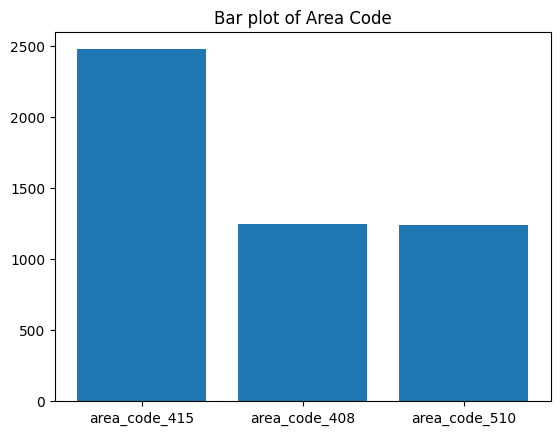

In [17]:
# Check for value counts
plt.bar(df['area.code'].value_counts().index, df['area.code'].value_counts())
plt.title('Bar plot of Area Code')

Text(0.5, 1.0, 'Bar plot of Voice Plan')

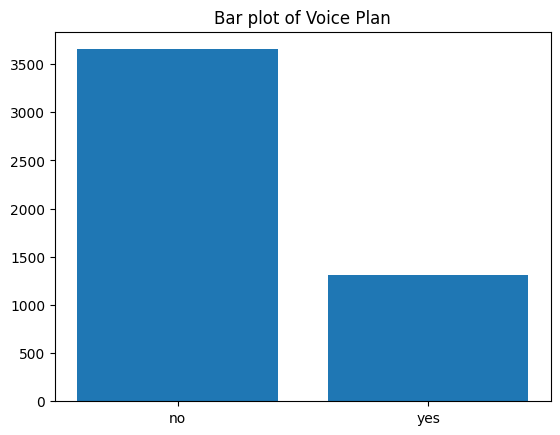

In [18]:
# Check for value counts
plt.bar(df['voice.plan'].value_counts().index, df['voice.plan'].value_counts())
plt.title('Bar plot of Voice Plan')

Text(0.5, 1.0, 'Bar plot of Intl.plan')

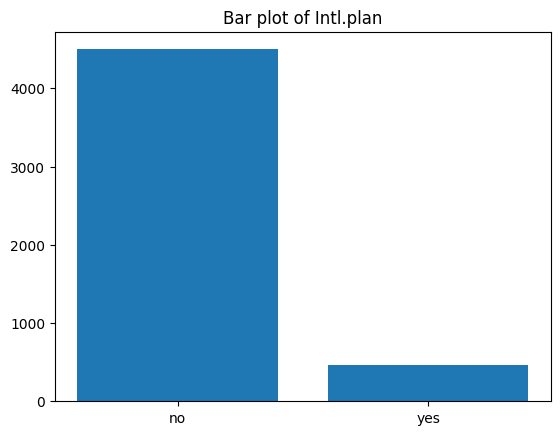

In [19]:
plt.bar(df['intl.plan'].value_counts().index, df['intl.plan'].value_counts())
plt.title('Bar plot of Intl.plan')

Text(0.5, 1.0, 'Bar plot of Churn')

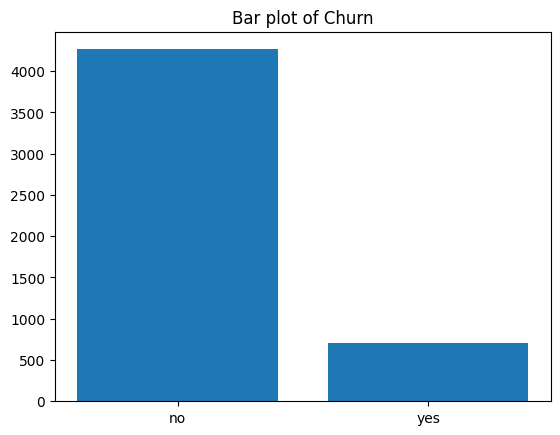

In [20]:
plt.bar(df['churn'].value_counts().index, df['churn'].value_counts())
plt.title('Bar plot of Churn')

Text(0.5, 1.0, 'Bar plot of States')

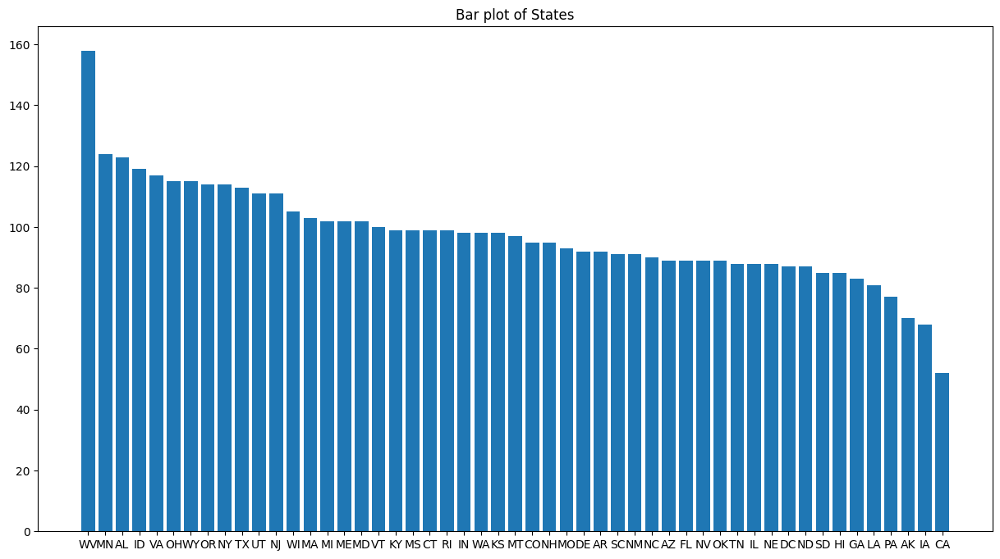

In [21]:
plt.figure(figsize=(15,8))
plt.bar(df['state'].value_counts().index, df['state'].value_counts())
plt.title('Bar plot of States')

## **Encoding**

In [22]:
# Using the above plots we can encode categorical values based on the order of quantity/value counts (except the yes/no columns)
df['area.code'].replace({'area_code_510':0, 'area_code_408':1, 'area_code_415':2},inplace=True)
df['area.code'].unique()

array([2, 1, 0], dtype=int64)

In [23]:
df['voice.plan'].replace({'no':0, 'yes':1},inplace=True)
df['voice.plan'].unique()

array([1, 0], dtype=int64)

In [24]:
df['intl.plan'].replace({'no':0, 'yes':1},inplace=True)
df['intl.plan'].unique()

array([0, 1], dtype=int64)

In [25]:
df['churn'].replace({'no':0, 'yes':1},inplace=True)
df['churn'].unique()

array([0, 1], dtype=int64)

For encoding the state column we will create a new data frame where we add the sorted values of each state code and add the encoding labels in the order

In [26]:
states = pd.DataFrame(df['state'].value_counts()) # Create new table with value counts
states.reset_index(inplace=True) # Extract the indices from the new dataframe
states.sort_values(by='count', inplace=True) # Order the list based on counts
states.reset_index(inplace=True) # Resets the indices to get a new order, and delete the new column if needed
states.drop('index',axis=1,inplace=True)
states['Labels'] = states.index # Create a new column from this new indices and keep name as Labels
states.drop(columns='count',inplace=True)
states

,state,Labels
0,CA,0
1,IA,1
2,AK,2
3,PA,3
4,LA,4
5,GA,5
6,HI,6
7,SD,7
8,ND,8
9,DC,9


In [27]:
# Create a mapping dictionary
state_labels = states.set_index('state')['Labels'].to_dict()
state_labels

{'CA': 0,
 'IA': 1,
 'AK': 2,
 'PA': 3,
 'LA': 4,
 'GA': 5,
 'HI': 6,
 'SD': 7,
 'ND': 8,
 'DC': 9,
 'NE': 10,
 'IL': 11,
 'TN': 12,
 'AZ': 13,
 'NV': 14,
 'FL': 15,
 'OK': 16,
 'NC': 17,
 'NM': 18,
 'SC': 19,
 'AR': 20,
 'DE': 21,
 'MO': 22,
 'CO': 23,
 'NH': 24,
 'MT': 25,
 'WA': 26,
 'IN': 27,
 'KS': 28,
 'RI': 29,
 'CT': 30,
 'MS': 31,
 'KY': 32,
 'VT': 33,
 'MD': 34,
 'ME': 35,
 'MI': 36,
 'MA': 37,
 'WI': 38,
 'NJ': 39,
 'UT': 40,
 'TX': 41,
 'NY': 42,
 'OR': 43,
 'WY': 44,
 'OH': 45,
 'VA': 46,
 'ID': 47,
 'AL': 48,
 'MN': 49,
 'WV': 50}

In [28]:
# Map the dictionary to the main dataframe df

df['state_label'] = df['state'].map(state_labels)
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,...,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn,state_label
1,KS,2,128,1,25,0,10.0,3,2.70,265.1,...,45.07,197.4,99,16.78,244.7,91,11.01,1,0,28
2,OH,2,107,1,26,0,13.7,3,3.70,161.6,...,27.47,195.5,103,16.62,254.4,103,11.45,1,0,45
3,NJ,2,137,0,0,0,12.2,5,3.29,243.4,...,41.38,121.2,110,10.30,162.6,104,7.32,0,0,39
4,OH,1,84,0,0,1,6.6,7,1.78,299.4,...,50.90,61.9,88,5.26,196.9,89,8.86,2,0,45
5,OK,2,75,0,0,1,10.1,3,2.73,166.7,...,28.34,148.3,122,12.61,186.9,121,8.41,3,0,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4996,HI,1,50,1,40,0,9.9,5,2.67,235.7,...,40.07,223.0,126,18.96,297.5,116,13.39,2,0,6
4997,WV,2,152,0,0,0,14.7,2,3.97,184.2,...,31.31,256.8,73,21.83,213.6,113,9.61,3,1,50
4998,DC,2,61,0,0,0,13.6,4,3.67,140.6,...,23.90,172.8,128,14.69,212.4,97,9.56,1,0,9
4999,DC,0,109,0,0,0,8.5,6,2.30,188.8,...,32.10,171.7,92,14.59,224.4,89,10.10,0,0,9


In [29]:
# Using LabelEncoder
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

df['state'] = le.fit_transform(df['state_label'])
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,...,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn,state_label
1,28,2,128,1,25,0,10.0,3,2.70,265.1,...,45.07,197.4,99,16.78,244.7,91,11.01,1,0,28
2,45,2,107,1,26,0,13.7,3,3.70,161.6,...,27.47,195.5,103,16.62,254.4,103,11.45,1,0,45
3,39,2,137,0,0,0,12.2,5,3.29,243.4,...,41.38,121.2,110,10.30,162.6,104,7.32,0,0,39
4,45,1,84,0,0,1,6.6,7,1.78,299.4,...,50.90,61.9,88,5.26,196.9,89,8.86,2,0,45
5,16,2,75,0,0,1,10.1,3,2.73,166.7,...,28.34,148.3,122,12.61,186.9,121,8.41,3,0,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4996,6,1,50,1,40,0,9.9,5,2.67,235.7,...,40.07,223.0,126,18.96,297.5,116,13.39,2,0,6
4997,50,2,152,0,0,0,14.7,2,3.97,184.2,...,31.31,256.8,73,21.83,213.6,113,9.61,3,1,50
4998,9,2,61,0,0,0,13.6,4,3.67,140.6,...,23.90,172.8,128,14.69,212.4,97,9.56,1,0,9
4999,9,0,109,0,0,0,8.5,6,2.30,188.8,...,32.10,171.7,92,14.59,224.4,89,10.10,0,0,9


In [30]:
# Drop columns 'state'
df.drop(columns='state_label', inplace=True)
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
1,28,2,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
2,45,2,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
3,39,2,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
4,45,1,84,0,0,1,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
5,16,2,75,0,0,1,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4996,6,1,50,1,40,0,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,0
4997,50,2,152,0,0,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,1
4998,9,2,61,0,0,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,0
4999,9,0,109,0,0,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,0


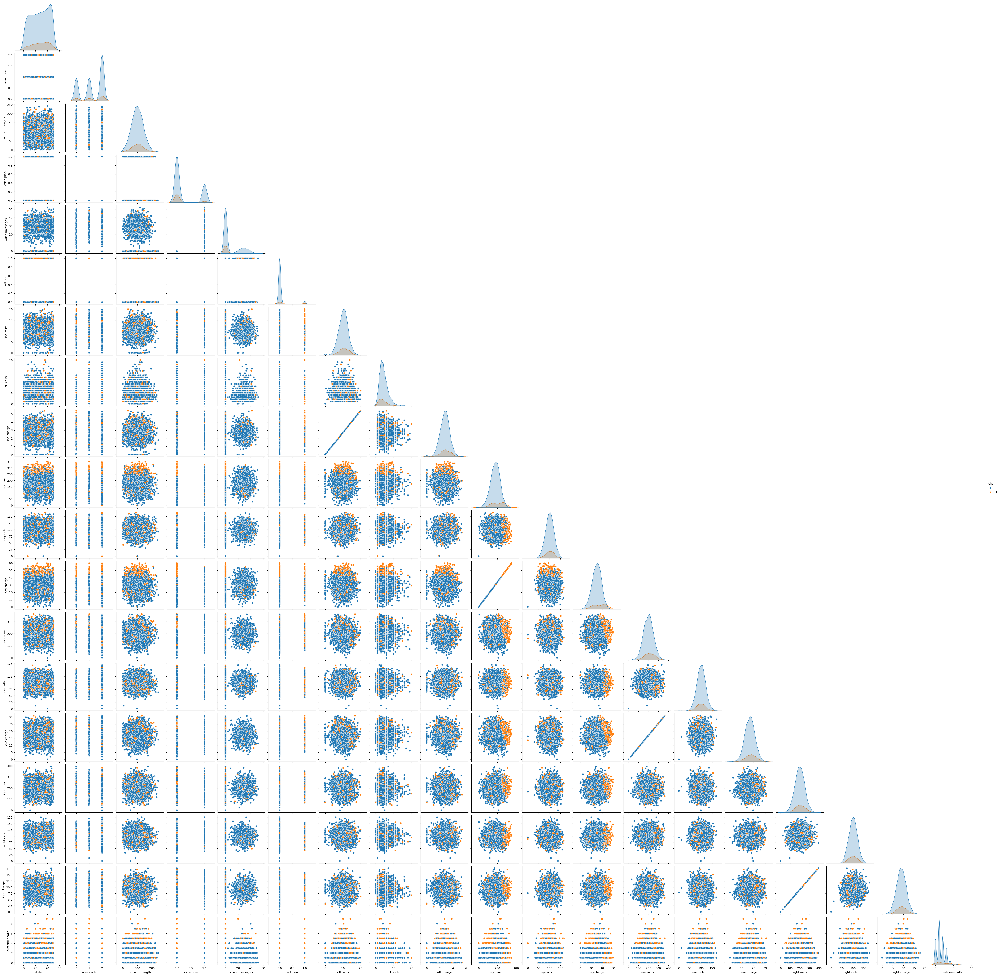

In [31]:
# Seaborn pairplot
sns.pairplot(df,hue='churn',corner=True)

<Axes: >

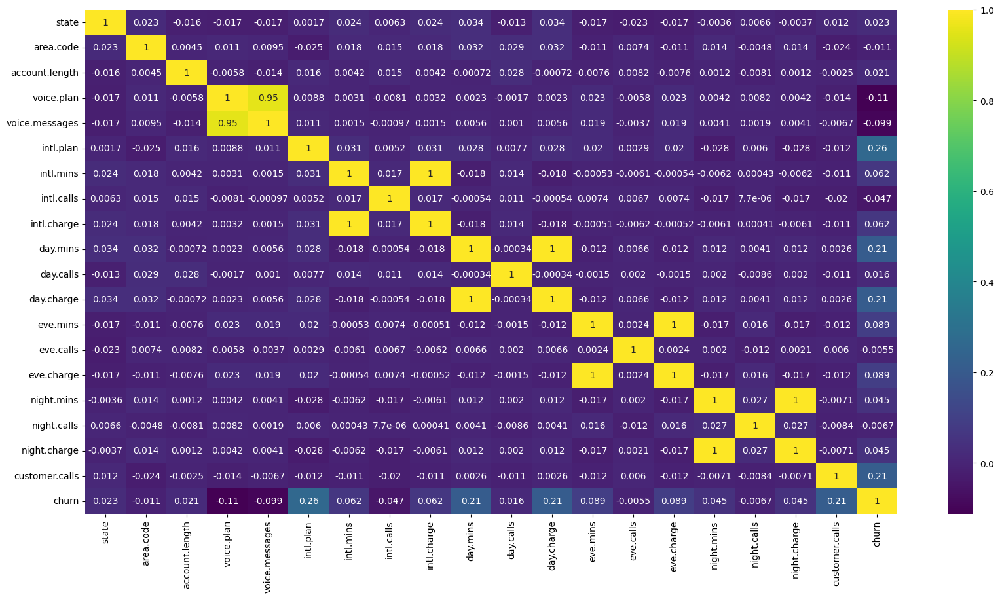

In [32]:
# Heatmap
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(),cmap='viridis',annot=True)

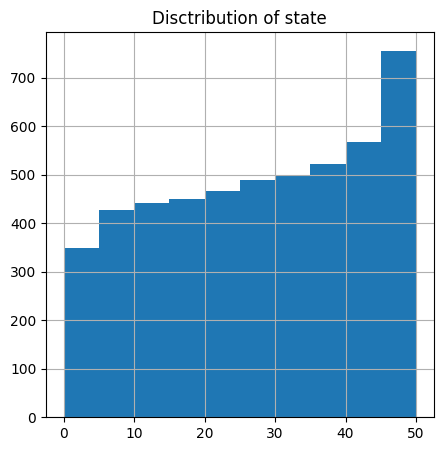

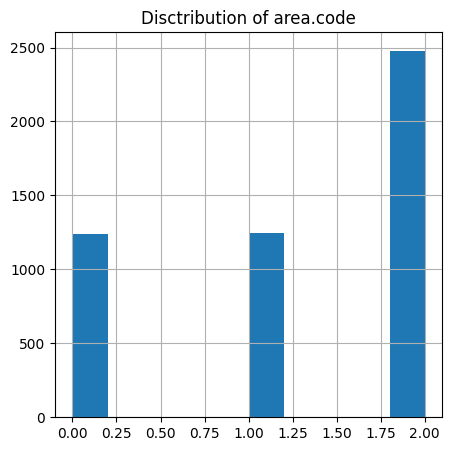

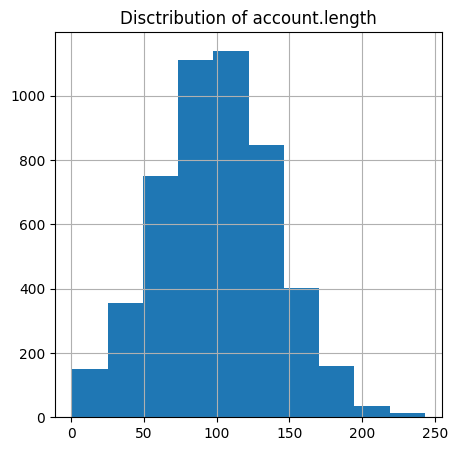

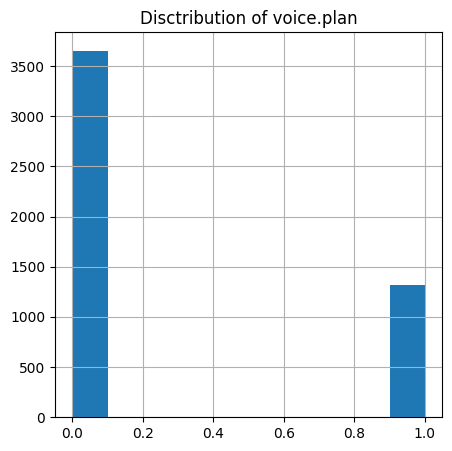

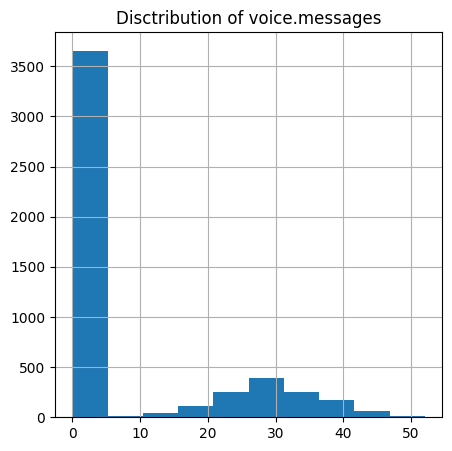

...

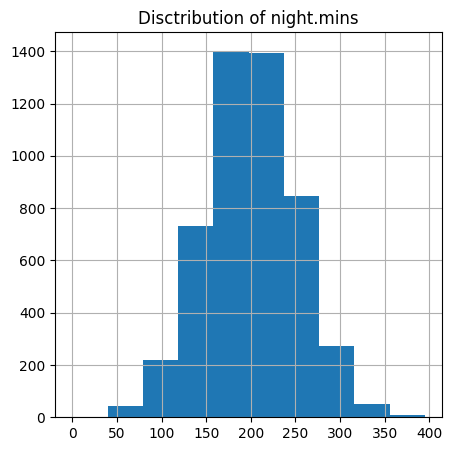

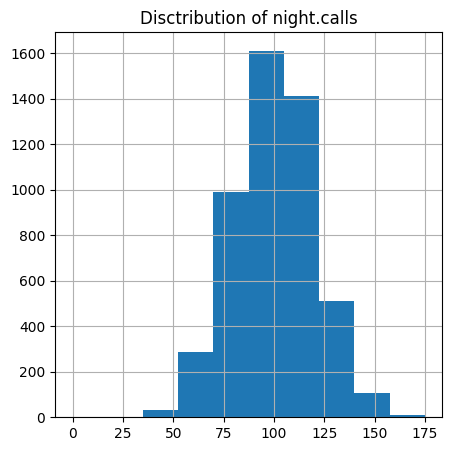

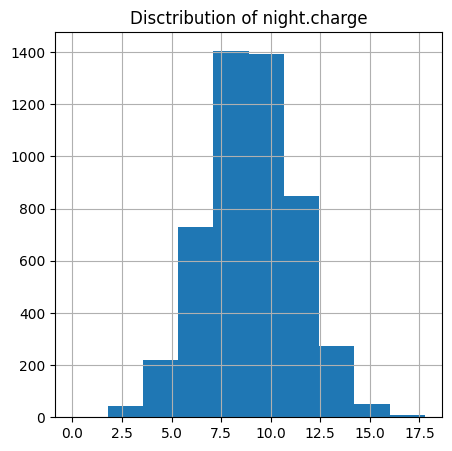

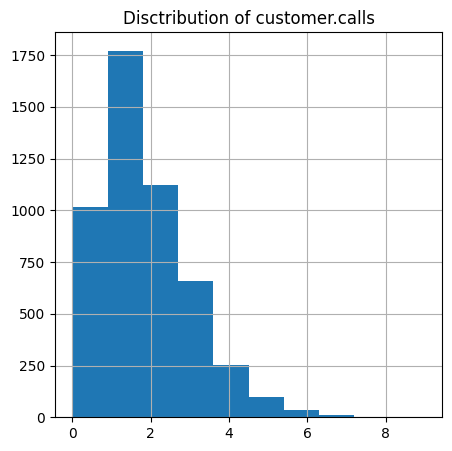

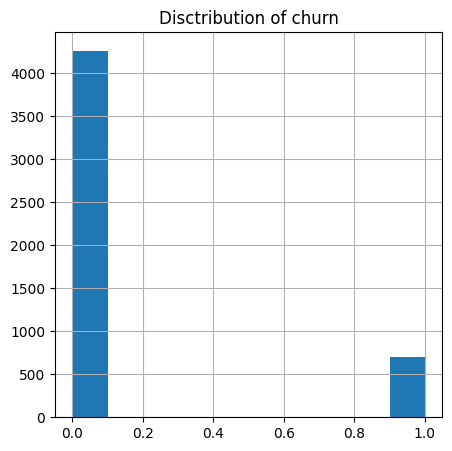

In [33]:
# Histogram distributions
for column in df.columns:
    plt.figure(figsize=(5, 5))
    plt.hist(df[column])
    plt.title(f'Disctribution of {column}')
    plt.grid(True)

Text(0.5, 1.0, 'Box-plot')

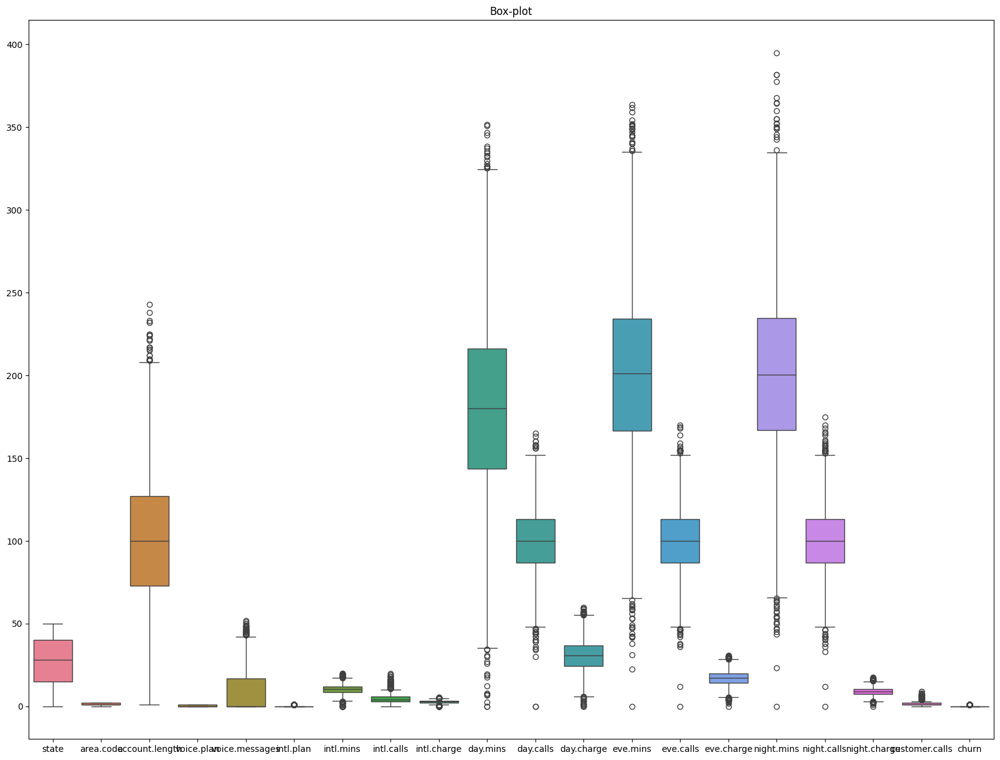

In [34]:
# Boxplot
plt.figure(figsize=(20,15))
sns.boxplot(df)
plt.title('Box-plot')

Inference:
- From the histograms, we can say that many of the features follow a nearly normal distribution, except for the features - voice.messages, intl.calls, day.calls, customer.calls
- From the boxplot we identify almost every column has outliers present. We can eliminate them in the next step which is model building.
- From the heatmap, we can see some of the features have 100% relationship with another feature, such as
  - intl.mins and intl.charge (100%)
  - day.mins and day.charge (100%)
  - eve.mins and eve.charge (100%)
  - night.mins and night.charge (100%)
  - voice.plan and voice.messages (95%)
  - The rest of the relationships are poor ranging between -0.1 to +0.26

In [35]:
# Drop the columns intl.charge, day.charge , eve.charge as they are highly correlated to calls columns
df_unlabeled.drop(columns=['intl.charge', 'day.charge' , 'eve.charge', 'night.charge'], inplace=True)

df.drop(columns=['intl.charge', 'day.charge' , 'eve.charge', 'night.charge'], inplace=True)
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,day.mins,day.calls,eve.mins,eve.calls,night.mins,night.calls,customer.calls,churn
1,28,2,128,1,25,0,10.0,3,265.1,110,197.4,99,244.7,91,1,0
2,45,2,107,1,26,0,13.7,3,161.6,123,195.5,103,254.4,103,1,0
3,39,2,137,0,0,0,12.2,5,243.4,114,121.2,110,162.6,104,0,0
4,45,1,84,0,0,1,6.6,7,299.4,71,61.9,88,196.9,89,2,0
5,16,2,75,0,0,1,10.1,3,166.7,113,148.3,122,186.9,121,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4996,6,1,50,1,40,0,9.9,5,235.7,127,223.0,126,297.5,116,2,0
4997,50,2,152,0,0,0,14.7,2,184.2,90,256.8,73,213.6,113,3,1
4998,9,2,61,0,0,0,13.6,4,140.6,89,172.8,128,212.4,97,1,0
4999,9,0,109,0,0,0,8.5,6,188.8,67,171.7,92,224.4,89,0,0


In [36]:
capping_df = df.drop(columns=['churn'])
capping_df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,day.mins,day.calls,eve.mins,eve.calls,night.mins,night.calls,customer.calls
1,28,2,128,1,25,0,10.0,3,265.1,110,197.4,99,244.7,91,1
2,45,2,107,1,26,0,13.7,3,161.6,123,195.5,103,254.4,103,1
3,39,2,137,0,0,0,12.2,5,243.4,114,121.2,110,162.6,104,0
4,45,1,84,0,0,1,6.6,7,299.4,71,61.9,88,196.9,89,2
5,16,2,75,0,0,1,10.1,3,166.7,113,148.3,122,186.9,121,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4996,6,1,50,1,40,0,9.9,5,235.7,127,223.0,126,297.5,116,2
4997,50,2,152,0,0,0,14.7,2,184.2,90,256.8,73,213.6,113,3
4998,9,2,61,0,0,0,13.6,4,140.6,89,172.8,128,212.4,97,1
4999,9,0,109,0,0,0,8.5,6,188.8,67,171.7,92,224.4,89,0


<Axes: >

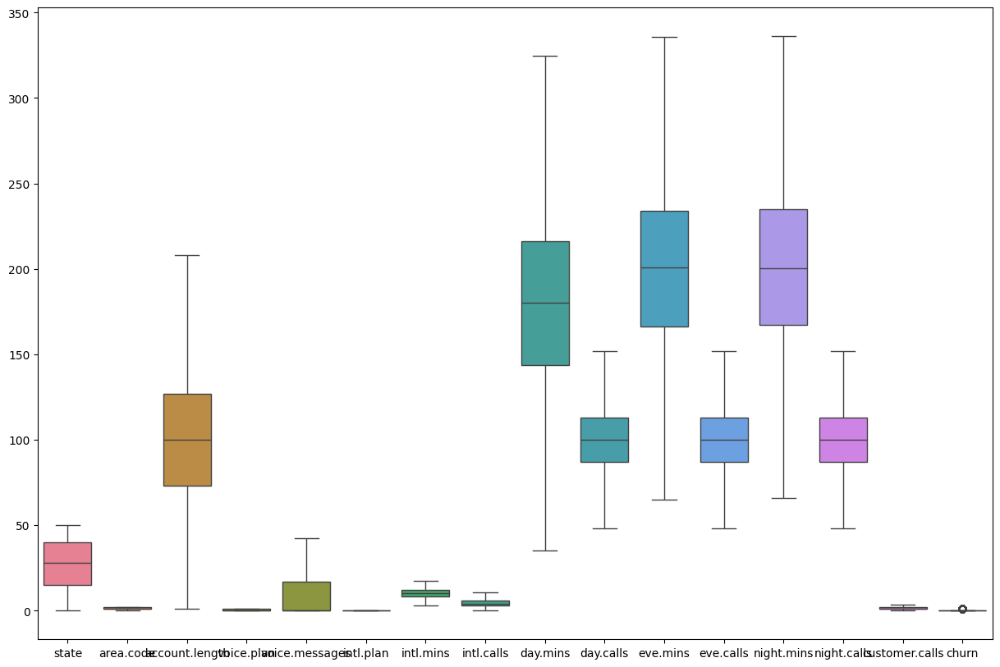

In [37]:
# Capping outliers
def outlier_cap(data, colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - (1.5 * iqr)
    upper = q3 + (1.5 * iqr)
    
    # Cap the outliers to the lower and upper bounds
    data[colname] = data[colname].apply(lambda x: upper if x > upper else (lower if x < lower else x))

for col in capping_df.select_dtypes(include=np.number).columns:
    outlier_cap(capping_df,col)

# Add the churn colunm back to capping_df
capping_df['churn'] = df['churn']
#Replace the df with capping_df
df = capping_df

plt.figure(figsize=(15,10))
sns.boxplot(df)

# **Model Building**

In [38]:
from sklearn.model_selection import train_test_split as tts

# Split the data set
x = df.drop(columns=['churn'])
y = df['churn']

xtrain, xtest, ytrain, ytest = tts(x, y, test_size=0.2, random_state=3)

In [39]:
from sklearn.metrics import recall_score, precision_score, accuracy_score, confusion_matrix, f1_score, ConfusionMatrixDisplay
from sklearn.metrics import classification_report, roc_curve, roc_auc_score, auc
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

In [40]:
# Create a dictionary of models
models = {'Logistic Regression':LogisticRegression(), 'SVC':SVC(probability=True), 'K-Nearest neighbors':KNeighborsClassifier(), 'Bagging Classifier':BaggingClassifier(), 'Random Forest':RandomForestClassifier(), 'Decision Tree':DecisionTreeClassifier()}

In [41]:
# Create empty lists to store the scores
modelnames = []
accuracies = []
recall = []
precision = []
f1_scores = []
roc_auc_scores = []

                 Model  Accuracy    Recall  Precision  F1-Score   ROC AUC
0  Logistic Regression  0.870221  0.053846   0.538462  0.097902  0.724955
1                  SVC  0.876258  0.053846   1.000000  0.102190  0.738212
2  K-Nearest neighbors  0.892354  0.338462   0.676923  0.451282  0.702493
3   Bagging Classifier  0.934608  0.576923   0.882353  0.697674  0.872480
4        Random Forest  0.934608  0.561538   0.901235  0.691943  0.877822
5        Decision Tree  0.882294  0.661538   0.540881  0.595156  0.788524


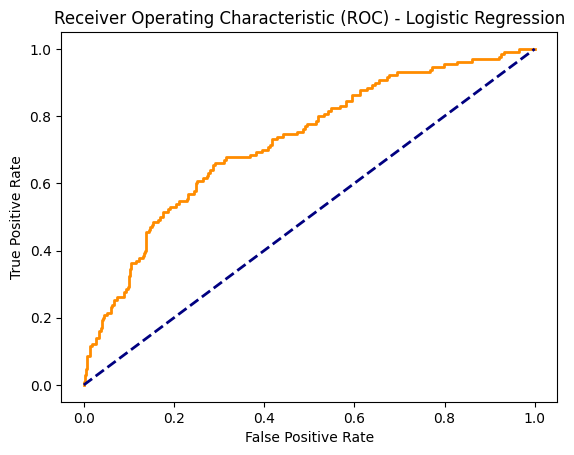

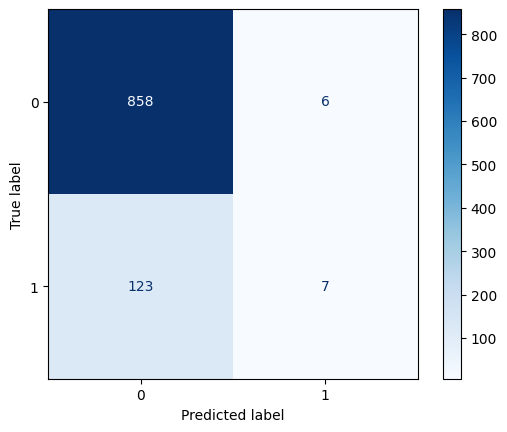

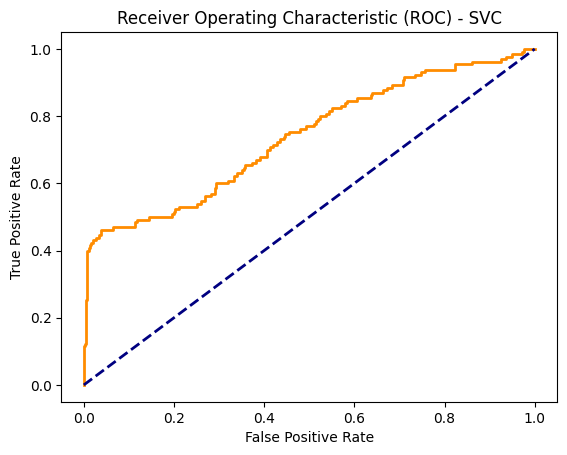

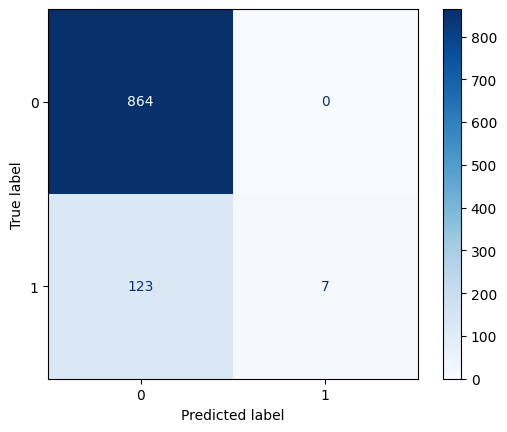

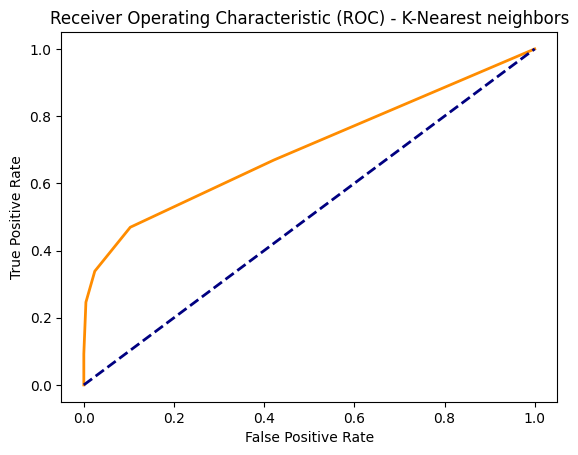

...

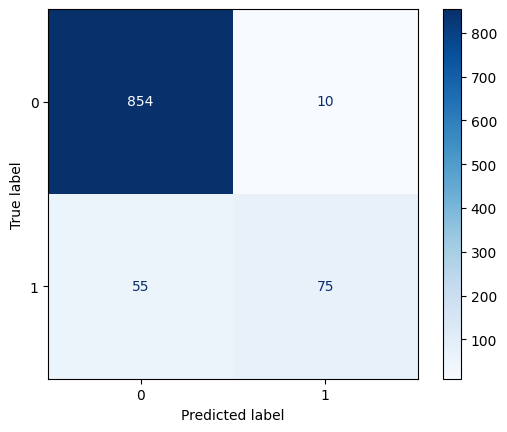

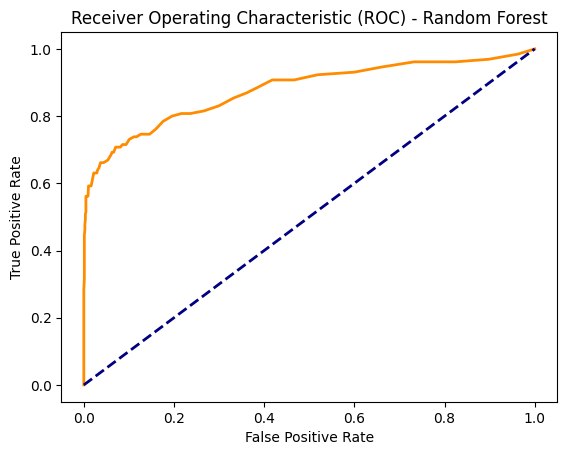

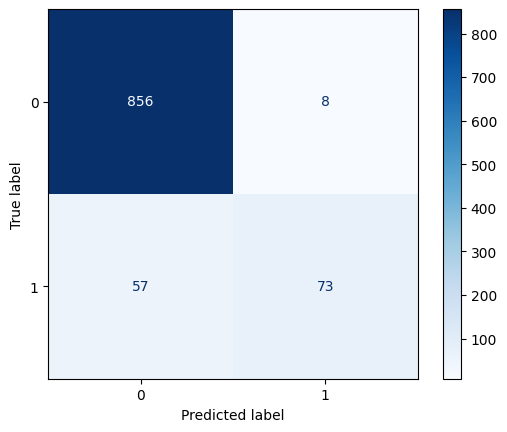

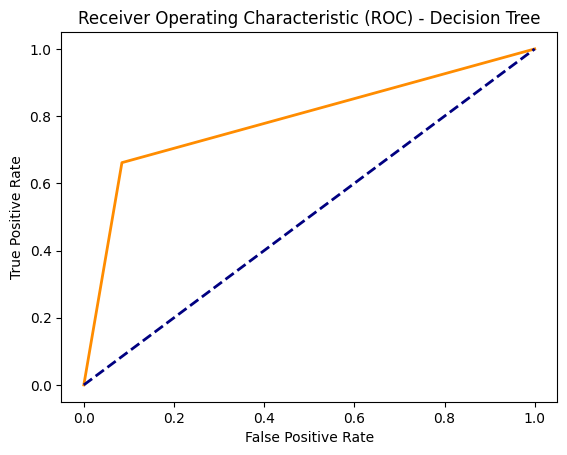

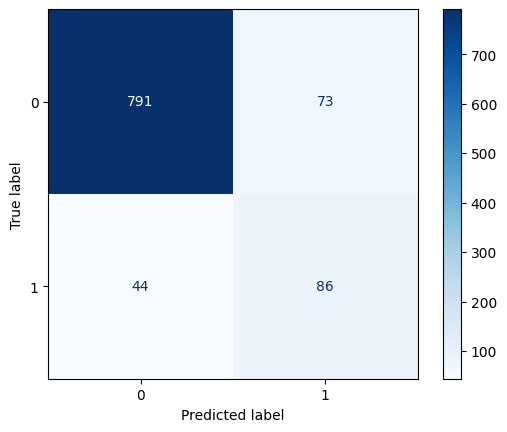

In [42]:
# Loop through each model and evaluate their scores
for name, model in models.items():
    modelnames.append(name)         # Add the name of the model
    model.fit(xtrain,ytrain)        # fit the model
    ypred = model.predict(xtest)    # predict the values
    accuracies.append(accuracy_score(ytest,ypred))   # Add the accuracy score
    recall.append(recall_score(ytest,ypred))         # Add the recall scores
    precision.append(precision_score(ytest,ypred))   # Add the precision scores
    f1_scores.append(f1_score(ytest,ypred))          # Add the F1-scores

    # Compute prediction probabilities for ROC
    if hasattr(model, "predict_proba"):  # Check if the model supports predict_proba
        y_proba = model.predict_proba(xtest)[:, 1]
    elif hasattr(model, "decision_function"):  # For models like SVM
        y_proba = model.decision_function(xtest)
    else:
        print(f"{name} does not support probability predictions.")
        roc_aucs.append(None)
        continue  # Skip ROC/AUC for this model
    
    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(ytest, y_proba)
    roc_auc = auc(fpr, tpr)
    roc_auc_scores.append(roc_auc)
    
    # Plot the ROC curve
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic (ROC) - {name}')

    # Plot the confusion matrix
    cm = confusion_matrix(ytest, ypred)
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1]).plot(cmap='Blues')

# Compile results into a DataFrame
metrics_df = pd.DataFrame({
    'Model': modelnames,
    'Accuracy': accuracies,
    'Recall': recall,
    'Precision': precision,
    'F1-Score': f1_scores,
    'ROC AUC': roc_auc_scores
})

print(metrics_df)

## **Hyperparameter tuning**

In [43]:
# Use the unlabeled set
df = df_unlabeled.copy(deep=True)
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,day.mins,day.calls,eve.mins,eve.calls,night.mins,night.calls,customer.calls,churn
1,KS,area_code_415,128,yes,25,no,10.0,3,265.1,110,197.4,99,244.7,91,1,no
2,OH,area_code_415,107,yes,26,no,13.7,3,161.6,123,195.5,103,254.4,103,1,no
3,NJ,area_code_415,137,no,0,no,12.2,5,243.4,114,121.2,110,162.6,104,0,no
4,OH,area_code_408,84,no,0,yes,6.6,7,299.4,71,61.9,88,196.9,89,2,no
5,OK,area_code_415,75,no,0,yes,10.1,3,166.7,113,148.3,122,186.9,121,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4996,HI,area_code_408,50,yes,40,no,9.9,5,235.7,127,223.0,126,297.5,116,2,no
4997,WV,area_code_415,152,no,0,no,14.7,2,184.2,90,256.8,73,213.6,113,3,yes
4998,DC,area_code_415,61,no,0,no,13.6,4,140.6,89,172.8,128,212.4,97,1,no
4999,DC,area_code_510,109,no,0,no,8.5,6,188.8,67,171.7,92,224.4,89,0,no


In [44]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder, FunctionTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn import set_config
set_config(display='diagram')

In [45]:
# Define a function to apply LabelEncoder
#def label_encode_column(column):
#    le = LabelEncoder()
#    return le.fit_transform(column)

In [46]:
# Transformer parameters
preprocessor = ColumnTransformer(transformers=[
    ('Encode',OrdinalEncoder(),[0,1,3,5]),                                  # Encode the data in categorical columns
    ('Scale',StandardScaler(),[2,4,6,7,8,9,10,11,12,13,14])      # Scale the dataset excluding the target column
], remainder='passthrough')

In [47]:
# Pipeline creation
pipeline = Pipeline(steps=[
    ('preprocessor',preprocessor),      # Preprocessing step
    ('classifier',LogisticRegression()) # Placeholder, will be replaced in GridSearchCV
])

In [48]:
# Define parameter grid
param_grid = [
    {'classifier': [LogisticRegression()], 'classifier__C': [0.1, 1, 10]},
    {'classifier': [SVC()], 'classifier__C': [0.1, 1, 10], 'classifier__kernel': ['linear', 'rbf']},
    {'classifier': [KNeighborsClassifier()], 'classifier__n_neighbors': [3, 5, 7], 'classifier__metric': ['minkowski', 'manhattan', 'euclidean', 'chebyshev']},
    {'classifier': [BaggingClassifier()], 'classifier__n_estimators': [10, 50, 100], 'classifier__max_features': [0.5, 0.8, 1.0]},
    {'classifier': [RandomForestClassifier()], 'classifier__n_estimators': [50, 100, 200], 'classifier__criterion': ['gini', 'entropy']},
    {'classifier': [DecisionTreeClassifier()], 'classifier__max_depth': [10, 20, 30], 'classifier__criterion': ['gini', 'entropy']}
]

In [49]:
from sklearn.model_selection import train_test_split as tts

# Split the data set
x = df.drop(columns=['churn'])
y = df['churn']

xtrain, xtest, ytrain, ytest = tts(x, y, test_size=0.2, random_state=1)

In [50]:
# Grid Search
from sklearn.model_selection import GridSearchCV

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(xtrain, ytrain)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('Encode',
                                                                         OrdinalEncoder(),
                                                                         [0, 1,
                                                                          3,
                                                                          5]),
                                                                        ('Scale',
                                                                         StandardScaler(),
                                                                         [2, 4,
                                                                          6, 7,
                                                                          8, 9,
                                                                          10,
                                                                          11,
                                                                          12,
                                                                          13,
                                                                          14])])),
                                       ('classifier', LogisticRegression())]),
             n_jobs=-1,
             param_grid=[{'classifier': [LogisticRegression()],
                          'classifier__C': [0.1, 1, 10]},
                         {'classifier...
                         {'classifier': [BaggingClassifier()],
                          'classifier__max_features': [0.5, 0.8, 1.0],
                          'classifier__n_estimators': [10, 50, 100]},
                         {'classifier': [RandomForestClassifier()],
                          'classifier__criterion': ['gini', 'entropy'],
                          'classifier__n_estimators': [50, 100, 200]},
                         {'classifier': [DecisionTreeClassifier()],
                          'classifier__criterion': ['gini', 'entropy'],
                          'classifier__max_depth': [10, 20, 30]}],
             scoring='accuracy')

In [51]:
# Results
print(f"Best Estimator: {grid_search.best_estimator_}")
print(f"Best Score: {grid_search.best_score_}")
print(f"Best Parameters: {grid_search.best_params_}")

Best Estimator: Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('Encode', OrdinalEncoder(),
                                                  [0, 1, 3, 5]),
                                                 ('Scale', StandardScaler(),
                                                  [2, 4, 6, 7, 8, 9, 10, 11, 12,
                                                   13, 14])])),
                ('classifier', BaggingClassifier(n_estimators=100))])
Best Score: 0.9554716981132076
Best Parameters: {'classifier': BaggingClassifier(), 'classifier__max_features': 1.0, 'classifier__n_estimators': 100}


## **Pipeline Creation**

In [52]:
# Transformer parameters
preprocessor = ColumnTransformer(transformers=[
    ('Encode',OrdinalEncoder(),[0,1,3,5]),                                  # Encode the data in categorical columns
    ('Scale',StandardScaler(),[2,4,6,7,8,9,10,11,12,13,14])      # Scale the dataset excluding the target column
], remainder='passthrough')

In [53]:
# Pipeline creation
model = Pipeline(steps=[
    ('preprocessor',preprocessor),      # Preprocessing step
    ('classifier',BaggingClassifier(max_features=1,n_estimators=100)) # Best model and with best parameters
])

In [54]:
# Fit the data
model.fit(xtrain, ytrain)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('Encode', OrdinalEncoder(),
                                                  [0, 1, 3, 5]),
                                                 ('Scale', StandardScaler(),
                                                  [2, 4, 6, 7, 8, 9, 10, 11, 12,
                                                   13, 14])])),
                ('classifier',
                 BaggingClassifier(max_features=1, n_estimators=100))])

In [55]:
# Create new pickle model file
import pickle
pickle.dump(model, open('Pickle_P465_classifier.pkl','wb'))

**Deployment using Streamlit done using .py file**